In [0]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import cv2

In [2]:
!git clone https://github.com/kmilo7204/Finding_Lane_Lines_Advanced.git

fatal: destination path 'Finding_Lane_Lines_Advanced' already exists and is not an empty directory.


## Camera Calibration
Functions in this section:

###  **obj_points:**

> Prepares the 3D object points in world coordinates as they are required for the camera calibration. The points are represented as (0,0,0), (1,0,0), (2,0,0),....,(6,5,0).


### **calibrate_camera:**

> Performs the camera calibration and returns the camera matrix and distortion coeficients. Internally the function detects the chessborad corners and draw them on the image.

The most important OpenCV functions used in this section are listed next:



*   cv2.findChessboardCorners()
*   cv2.drawChessboardCorners()
*   cv2.calibrateCamera()






In [0]:
def obj_points(ncor_x, ncor_y):
    ## Function to prepare the object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    
      #Inputs: Number of corners in X, Number of corners in Y
      #Output: Object points
      
    ##
    objpts = np.zeros((ncor_x * ncor_y, 3), np.float32)
    objpts[:, :2] = np.mgrid[0:ncor_x, 0:ncor_y].T.reshape(-1, 2)
    return objpts

def calibrate_camera(ncor_x, ncor_y):
    ## Function to perform the camera calibration
  
      #Inputs: Number of corners in X, Number of corners in Y
      #Output: Camera matrix, Distortion coefficients
      
    ##  
    print("Camera calibration")
    # Call the obj_points function with the coordinates (We get an array)
    objp = obj_points(ncor_x, ncor_y)
    objpoints = [] # 3d point in world space
    imgpoints = [] # 2d points in image plane.
    # To read the images in the specific directory
    calib_image_ls = glob.glob("./Finding_Lane_Lines_Advanced/camera_cal/calibration*.jpg")
    print("Processing {} images".format(len(calib_image_ls)))
    idx = 0
    
    fig, axs = plt.subplots(len(calib_image_ls), 2, figsize = (10, 50))
    fig.tight_layout()
    
    for fname in calib_image_ls:
      img = cv2.imread(fname)
      img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
      gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      
      ret, corners = cv2.findChessboardCorners(gray_img, (ncor_x, ncor_y), None)
      
      if ret == True:
        # Object and image points
        objpoints.append(objp)
        imgpoints.append(corners)
        
        axs[idx][0].imshow(img)
        axs[idx][0].axis('off')
        axs[idx][0].set_title("Calibration Image")
        
        img_chess = cv2.drawChessboardCorners(img, (ncor_x, ncor_y), corners, ret)
        axs[idx][1].imshow(img_chess)
        axs[idx][1].axis('off')
        axs[idx][1].set_title("Chessboard Corners")
        
        idx += 1
        
      else:
        
        axs[idx][0].imshow(img)
        axs[idx][0].axis('off')
        axs[idx][0].set_title("Calibration Image")
        
        axs[idx][1].imshow(img)
        axs[idx][1].axis('off')
        axs[idx][1].set_title("Not detection")
        
        idx += 1
    
    # Function to calibrate the camera
    # We just need the first two values camera matrix and the distortion coeficients
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    return mtx, dist

Camera calibration
Processing 20 images


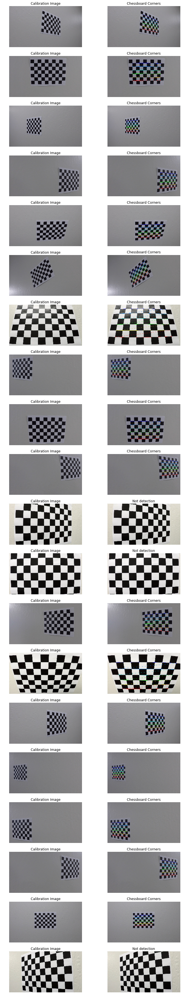

In [4]:
num_corners_x = 9
num_corners_y = 6

mtx, dist = calibrate_camera(ncor_x = num_corners_x, ncor_y = num_corners_y)

## Undistorting images
Functions in this section:

### undistort_img:


> This function undistorts each image or frame of the video by using the camera matrix (Containing the focal length and the optical centers) and the distortion coefficients.

The most important OpenCV function used in this section is listed next:


*   cv2.undistort()




In [0]:
def undistort_img(img, mtx, dist):
    ## Function to undistort the image
    
      # Inputs: Image, Camera matrix, Distortion coefficients
      # Output: Undistorted Image
      
    ##
    undistort_img = cv2.undistort(img, mtx, dist, None, mtx)
    return undistort_img

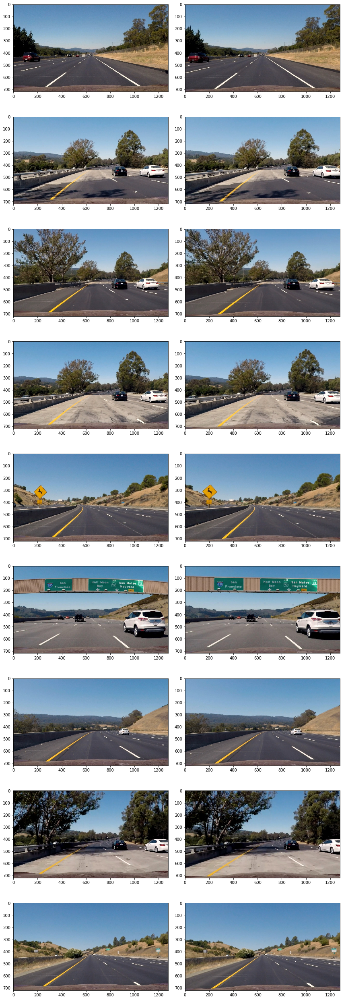

In [6]:
test_image_ls = glob.glob('./Finding_Lane_Lines_Advanced/test_images/*')
fig, axs = plt.subplots(len(test_image_ls), 2, figsize = (12,35))
fig.tight_layout()

idx = 0
for image in test_image_ls:
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  axs[idx][0].imshow(img)
  udst_img = undistort_img(img, mtx, dist)
  axs[idx][1].imshow(udst_img)
  
  idx += 1

## Image Thresholding
Functions in this section:

### color_threshold:
>This function performs the image thresholding. It applies a RGB White filter, a HSV White filter, a HSL Yelloww filter and a HSV Yellow filter to the input image in combination with the **gray_equalization** and **img_binary** functions. The output of this function is a binary image (Pixel values as 0 or 1).

### gray_equalization:
>This function performs a Histogram Equalization in the gray image in order to increase the overall contrast of the image.


### img_binary:
>This function binarizes the image, in order words it provides a representation of the image in just two values (0 or 1).

### img_segmentation:
>This function calls the **color_threshold** function to return a binarized image with the white and yellow pixels found in the RGB input image.

The most important OpenCV functions used in this section are listed next:


*   cv2.equalizeHist()
*   cv2.inRange()
*   cv2.bitwise_and()


In [0]:
def gray_equalization(img):
  ## Function to equalize the histogram of the gray image
  
    # Input: Gray image
    # Output: Equalized image (Histogram equalized)
    
  ##
  img_eq = cv2.equalizeHist(img)
  return img_eq

def img_binary(img, threshold = (35, 255)):
  ## Function to perfom image binarization within the threshold.
  
    # Input: Equalized image
    # Output: Binary image
  
  ##
  img_bin = np.zeros_like(img)
  img_bin[(img >= threshold[0]) & (img <= threshold[1])] = 1
  return img_bin
  
def color_threshold(img):
  ## Function to apply the color thresholds to identify the white and yellow elements
  
    # Input: Undistorted RGB image
    # Output: Binary image (After color threshold)
    
  ##
  # RGB White Filter
  mask_rgb_white = cv2.inRange(img, (200, 200, 200), (255, 255, 255))
  rgb_w = cv2.bitwise_and(img, img, mask = mask_rgb_white).astype(np.uint8)
  # Binary threshold - Not necessary, but is used as other filter
  rgb_w = cv2.cvtColor(rgb_w, cv2.COLOR_RGB2GRAY)
  rgb_w = gray_equalization(rgb_w)
  rgb_w = img_binary(rgb_w)

  hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
  # HLS Yellow Filter
  mask_hls_yellow = cv2.inRange(hls, (15, 50, 100), (47, 220, 255))
  hls_y = cv2.bitwise_and(img, img, mask = mask_hls_yellow).astype(np.uint8)
  # Binary threshold - Not necessary, but is used as other filter
  hls_y = cv2.cvtColor(hls_y, cv2.COLOR_HLS2RGB)
  hls_y = cv2.cvtColor(hls_y, cv2.COLOR_RGB2GRAY)
  hls_y = gray_equalization(hls_y)
  hls_y = img_binary(hls_y)

  hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
  # HSV White Filter
  mask_hsv_white = cv2.inRange(hsv, (0, 0, 205), (255, 25, 255))
  hsv_w = cv2.bitwise_and(img, img, mask = mask_hsv_white).astype(np.uint8)
  # Binary threshold - Not necessary, but is used as other filter
  hsv_w = cv2.cvtColor(hsv_w, cv2.COLOR_HSV2RGB)
  hsv_w = cv2.cvtColor(hsv_w, cv2.COLOR_RGB2GRAY)
  hsv_w = gray_equalization(hsv_w)
  hsv_w = img_binary(hsv_w)

  # HSV Yellow Filter
  mask_hsv_yellow = cv2.inRange(hsv, (21, 60, 80), (40, 255, 255))
  hsv_y = cv2.bitwise_and(img, img, mask = mask_hsv_yellow).astype(np.uint8)
  # Binary threshold - Not necessary, but is used as other filter
  hsv_y = cv2.cvtColor(hsv_y, cv2.COLOR_HSV2RGB)
  hsv_y = cv2.cvtColor(hsv_y, cv2.COLOR_RGB2GRAY)
  hsv_y = gray_equalization(hsv_y)
  hsv_y = img_binary(hsv_y)

  mask = (rgb_w | hsv_w) | (hls_y | hsv_y)
  return mask
  
def img_segmentation(img):
  ## Function to call the color threshold function
  
    # Input: Undistorted RGB image
    # Output: Binary image (After color threshold)
    
  ##
  binary_img = color_threshold(img)
  return binary_img

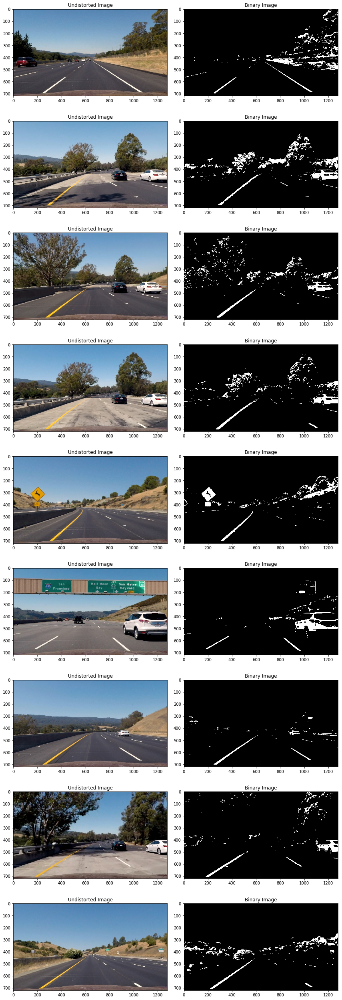

In [8]:
test_images_ls = glob.glob('./Finding_Lane_Lines_Advanced/test_images/*')
fig, axs = plt.subplots(len(test_images_ls), 2, figsize = (12,35))
fig.tight_layout()

idx = 0

for image in test_images_ls:
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  
  axs[idx][0].imshow(udst_img)
  axs[idx][0].set_title("Undistorted Image")
  axs[idx][1].imshow(bin_img, cmap = 'gray')
  axs[idx][1].set_title("Binary Image")
  
  idx += 1

## Bird's Eye View
Functions in this section:

### transformation_mtx:
>This function find the Matrix transformation to warp the image. With this same function we can obtain the inverse transformation matrix, to return to the original view of the image.

### birdseye_transform:
>This function performs the Bird's Eye transformation. It requires the matrix obtained from the **transformation_mtx** function. 

### warp_image:
>This function blends the **transformation_mtx** and the **birdseye_transform** function to perform the whole transformation.


The most important OpenCV functions used in this section are listed next:

*   cv2.getPerspectiveTransform()
*   cv2.warpPerspective()



In [0]:
def transformation_mtx():
  ## Function to calculate the transformation matrix for the Bird's eye view
  
    # Input: ---
    # Output: Transformation matrix, Inverse Transformation matrix
    
  ##
  # Points are defined for both arrays in the next order: TL, TR, BR, BL
  # Source points(src) = inpts, Destinations points(dst) = outpts
  inpts = np.float32([(532, 465), (744, 465), (1280, 710), (0, 710)])
  outpts = np.float32([(0, 0), (1280, 0), (1280, 720), (0, 720)])

  M = cv2.getPerspectiveTransform(inpts, outpts)
  Minv = cv2.getPerspectiveTransform(outpts, inpts)
  return M, Minv
  
def birdseye_transform(img, M):
  ## Function to perform the Bird's eye view transformation
  
    # Input: Binary image, Transformation matrix
    # Output: Binary bird's eye image
    
  ##
  h = img.shape[0]
  w = img.shape[1]
  birdseye_img = cv2.warpPerspective(img, M, (w, h), flags = cv2.INTER_LINEAR)
  return birdseye_img

def warp_img(img):
  ## Function to perform the Bird's eye view transformation (By using the other two functions)
  
    # Input: Binary image
    # Output: Binary bird's eye image
    
  ##
  M, Minv = transformation_mtx()
  birdseye_img = birdseye_transform(img, M)

  return birdseye_img

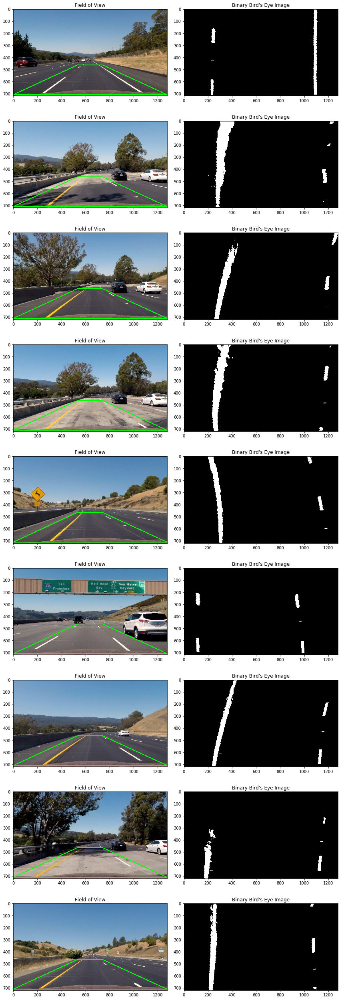

In [10]:
test_image_ls = glob.glob('./Finding_Lane_Lines_Advanced/test_images/*')
fig, axs = plt.subplots(len(test_images_ls), 2, figsize = (12, 35))
fig.tight_layout()

idx = 0

for image in test_images_ls:
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  
  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  birdseye_img = warp_img(bin_img)
  
  pts = np.array([(0, 710),(1280, 710), (744, 465), (532, 465)], np.int32)
  poly_img = cv2.polylines(udst_img, [pts], True, (0, 255, 0), 5)
  
  axs[idx][0].imshow(poly_img)
  axs[idx][0].set_title("Field of View")
  axs[idx][1].imshow(birdseye_img, cmap = 'gray')
  axs[idx][1].set_title("Binary Bird's Eye Image")
  
  idx += 1

## Finding the lane lines 
### Histogram and Sliding window method
Functions in this section:

### histogram_calculation:
>This function calculates the histogram of a binary image. It is done by adding the pixels in each column. This function allows ud to find to peaks corresponding to the left and right lines.

### window_sample:
>This function performs the sliding window technique. It start form the bottom of the image, then in each pixel coordinate provided by the histogram for each line, it creates a window, after that 6 additional windows are stacked vertically. The position of each window is updated by counting the minimum amount of pixels.



In [0]:
def histogram_calculation(proc_img):
  ## Function to calculate the histogram of the binary image

    # Input: Binary bird's eye image
    # Output: Histogram, Index at the max left peak, Index at the max right peak
  
  ##

  # The histogram only processes the second half of the image (Axis 0 along the rows - 1 x 1280)
  hist = np.sum(proc_img[int(proc_img.shape[0] / 2):, :], axis = 0)
  center = np.int(hist.shape[0] / 2)
  max_left = np.argmax(hist[:center])
  max_right = np.argmax(hist[center:]) + center

  return hist, max_left, max_right


def window_sample(proc_img, draw = False):
  ## Function to find the lanes using window sampling, this function also locates and draw the windows.
  
    # Input: Brinary Bird's eye image, Bool to draw the windows
    # Output: X left indices, Y left indices, X right indices, Y right indices, Window image

  ##
  _, max_left, max_right = histogram_calculation(proc_img)
  img_height = np.int(proc_img.shape[0])

  # Number of windows per image
  nswin = 7
  # Windows height based on the input image
  w_height = np.int(proc_img.shape[0] / nswin)
  # Windows width
  w_width = 100
  # The minimum number of pixels per window (Used to recenter the new window)
  min_pixref = 50

  # We need to find the positions of the pixels that are different to zero in the binary image
  nzero = proc_img.nonzero()
  nzero_x = np.array(nzero[1])
  nzero_y = np.array(nzero[0])

  # Empty lists to receive left and right pixel indices
  left_lane_idx = []
  right_lane_idx = []

  # Current values of the maximum left and right indices (Used to draw the image around these values)
  leftx_curr = max_left
  rightx_curr = max_right

  # Create an output image (same sizes but three channels depth) to draw on and visualize the result
  out_img = np.dstack((proc_img, proc_img, proc_img)) * 255

  # For, to locate the windows in the image
  for window in range(nswin):
      # Coordinates to draw the windows in each part of the image
      y_top = img_height - (window * w_height)
      y_bot = img_height - ((window + 1) * w_height)
      x_left_l = leftx_curr - w_width
      x_left_r = leftx_curr + w_width
      x_right_l = rightx_curr - w_width
      x_right_r = rightx_curr + w_width

      if draw: 
        # Draw the windows over the output image
        cv2.rectangle(out_img, (x_left_l, y_bot), (x_left_r, y_top), (0, 255, 0), 3)
        cv2.rectangle(out_img, (x_right_l, y_bot), (x_right_r, y_top), (0, 255, 0), 3)

      # Find the nonzero pixels indices in x and y within each window (Returns one value which represents the index)
      left_idx = ((nzero_y >= y_bot) & (nzero_y < y_top) & (nzero_x >= x_left_l) & (nzero_x < x_left_r)).nonzero()[0]
      right_idx = ((nzero_y >= y_bot) & (nzero_y < y_top) & (nzero_x >= x_right_l) & (nzero_x < x_right_r)).nonzero()[0]

      # Append the left and right indices found before
      left_lane_idx.append(left_idx)
      right_lane_idx.append(right_idx)

      # If the number of indices within each window is greater than 50, we calculate the mean of that points to recenter the next window
      if len(left_idx) > min_pixref:
          leftx_curr = np.int(np.mean(nzero_x[left_idx]))
      if len(right_idx) > min_pixref:
          rightx_curr = np.int(np.mean(nzero_x[right_idx]))

  # Concatenate the left and right indices (This is just to obtain the total amount of indices for each line)
  left_lane_idx = np.concatenate(left_lane_idx)
  right_lane_idx = np.concatenate(right_lane_idx)

  # Extract the left and right lines pixels positions in X and Y
  left_x = nzero_x[left_lane_idx]
  left_y = nzero_y[left_lane_idx]
  right_x = nzero_x[right_lane_idx]
  right_y = nzero_y[right_lane_idx]

  return left_x, left_y, right_x, right_y, out_img

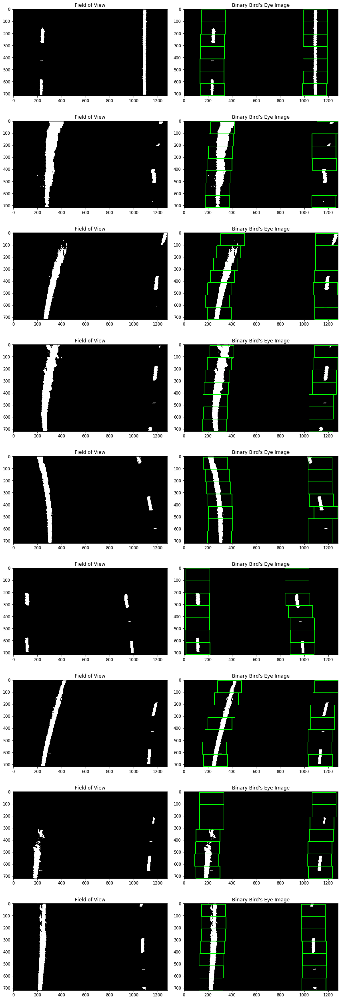

In [12]:
test_image_ls = glob.glob('./Finding_Lane_Lines_Advanced/test_images/*')
fig, axs = plt.subplots(len(test_images_ls), 2, figsize = (12, 35))
fig.tight_layout()

idx = 0

for image in test_images_ls:
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  
  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  birdseye_img = warp_img(bin_img)
  left_x, left_y, right_x, right_y, out_img = window_sample(birdseye_img, draw = True)
  
  axs[idx][0].imshow(birdseye_img, cmap = 'gray')
  axs[idx][0].set_title("Field of View")
  axs[idx][1].imshow(out_img, cmap = 'gray')
  axs[idx][1].set_title("Binary Bird's Eye Image")
  
  idx += 1

## Finding the lane lines 
### 2nd Degree polynomial fit
Functions in this section:

### pol_lines:
>This function calculates the 2nd degree polynomial based on the points for the left and right line (found in the sliding window function).

### pol_lines_fit:
>This function draws the 2nd degre polynomial curve calculated with the function **pol_lines**. In addition, this function fills the area of the windows as this will be used for video processing.


In [0]:
def pol_lines(out_img, left_x, left_y, right_x, right_y):
  ## Function to calculate the 2nd degree polynomial and fit it with the lanes based on the left (x, y) and right (x, y) values

    # Input: Window image, X left indices, Y left indices, X right indices, Y right indices
    # Output: Left secord order curves, Right secord order curves, Left polynomial parameters, Right polynomial parameters, Y plotting data
    
  ##
  y_dim = out_img.shape[0]

  # Calculate the second order polynomial curve based on the (x, y) points for each line
  left_pol_par = np.polyfit(left_y, left_x, 2)
  right_pol_par = np.polyfit(right_y, right_x, 2)

  ## X and Y values generation to graph the lines
  # Generation of the Y axis values (Rows of the image)
  ploty = np.linspace(0, y_dim - 1, y_dim)

  # Generation of the X axis values
  left_curve = left_pol_par[0]*ploty**2 + left_pol_par[1]*ploty + left_pol_par[2]
  right_curve = right_pol_par[0]*ploty**2 + right_pol_par[1]*ploty + right_pol_par[2]

  return left_curve, right_curve, left_pol_par, right_pol_par, ploty

  
def pol_lines_fit(out_img, left_x, left_y, right_x, right_y, fill = False):
  ## Function to draw the 2nd degree polynomial curves to each line

    # Input: Window image, X left indices, Y left indices, X right indices, Y right indices
    # Output: Left secord order curves, Right secord order curves, Lines image
    
  ##
    
  left_curve, right_curve, left_pol_par, right_pol_par, ploty = pol_lines(out_img, left_x, left_y, right_x, right_y)

  # Color the left and right pixels in the out image
  out_img[left_y, left_x] = [255, 0, 0]
  out_img[right_y, right_x] = [0, 0, 255]
  
  # To draw the Polyline in the out image
  left = np.asarray(tuple(zip(left_curve, ploty)), np.int32)
  right = np.asarray(tuple(zip(right_curve, ploty)), np.int32)
  cv2.polylines(out_img, [left], False, (255, 255, 0), 5)
  cv2.polylines(out_img, [right], False, (255, 255, 0), 5)
  
  if fill:
      fill_win_img = np.zeros_like(out_img)
      left_line_win1 = np.array([np.transpose(np.vstack([left_curve - 100, ploty]))])
      left_line_win2 = np.array([np.flipud(np.transpose(np.vstack([left_curve + 100, ploty])))])
      left_line_points = np.hstack((left_line_win1, left_line_win2))

      right_line_win1 = np.array([np.transpose(np.vstack([right_curve - 100, ploty]))])
      right_line_win2 = np.array([np.flipud(np.transpose(np.vstack([right_curve + 100, ploty])))])
      right_line_points = np.hstack((right_line_win1, right_line_win2))

      cv2.fillPoly(fill_win_img, np.int_([left_line_points]), (0, 255, 0))
      cv2.fillPoly(fill_win_img, np.int_([right_line_points]), (0, 255, 0))

      out_img = cv2.addWeighted(out_img, 1, fill_win_img, 0.3, 0)
  
  return left_curve, right_curve, out_img 

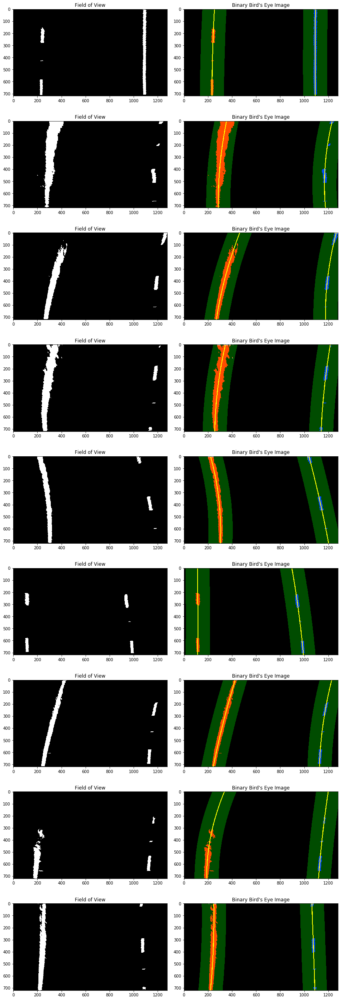

In [14]:
test_image_ls = glob.glob('./Finding_Lane_Lines_Advanced')
fig, axs = plt.subplots(len(test_images_ls), 2, figsize = (12, 35))
fig.tight_layout()

idx = 0

for image in test_images_ls:
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  
  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  birdseye_img = warp_img(bin_img)
  left_x, left_y, right_x, right_y, winds_img = window_sample(birdseye_img, draw = False)
  left_curve, right_curve, winds_img = pol_lines_fit(winds_img, left_x, left_y, right_x, right_y, fill = True)

  
  axs[idx][0].imshow(birdseye_img, cmap = 'gray')
  axs[idx][0].set_title("Field of View")
  axs[idx][1].imshow(winds_img, cmap = 'gray')
  axs[idx][1].set_title("Binary Bird's Eye Image")
  
  idx += 1

## Vehicle position and Road curvature
Functions in this section:

### line_projection:
>This function projects the lines and the "pipeline" in the RGB image.

### curvature:
>This function calculates the road curvature (It returns the mean curvature). Some scale measurements (From pixels to meters) are used in this function.

### offset:
>This function calculates the vehicle offset within the lane (How far the vehicle is from the center of the lane). Similar to the **curvature** function, some scale measurtements are used.

### info_frame:
>This function creates and adds the binary image and the polynomial fit image to the final frame, to provide more information about the process.

In [0]:
def line_projection(img, proc_img, left_curve, right_curve, ploty, Minv):
  ## Function to project the "pipeline"  in the Undistorted RGB image

    # Input: Undistorted image, Bird's eye image, Left curve, Right curve, Y values, Inverse transformation matrix
    # Output: Final image
    
  ##

  # Create the three channel bird's image
  warp_zero = np.zeros_like(proc_img).astype(np.uint8)
  color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

  # To gather the points to draw the boundaries and the pipeline
  left_points = np.array([np.transpose(np.vstack([left_curve, ploty]))])
  right_points = np.array([np.flipud(np.transpose(np.vstack([right_curve, ploty])))])
  points = np.hstack((left_points, right_points))

  # To draw the left and right boundaries
  cv2.polylines(color_warp, np.int_([left_points]), False, (255, 0, 0), 25)
  cv2.polylines(color_warp, np.int_([right_points]), False, (0, 0, 255), 25)

  # To draw the pipeline
  cv2.fillPoly(color_warp, np.int_([points]), (0, 255, 0))

  # To return the color bird's image to the original plane (Inverse Transformation)
  color_per = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))

  # To combine the original image and the color bird's image
  res_img = cv2.addWeighted(img, 1, color_per, 0.5, 0)

  return res_img

def curvature(img_proc, left_x, left_y, right_x, right_y):
  ## Function to calculate the lane curvature

    # Input: Bird's eye image, X left indices, Y left indices, X right indices, Y right indices
    # Output: Mean curvature
    
  ##
  ym_pp = 30.0 / 720
  xm_pp = 3.7 / 700
  y_dim = img_proc.shape[0] - 1
  
  left_fitx_curv = np.polyfit((left_y * ym_pp), (left_x * xm_pp), 2)
  right_fitx_curv = np.polyfit((right_y * ym_pp), (right_x * xm_pp), 2)

  left_curv = ((1 + ((2 * left_fitx_curv[0] * y_dim * ym_pp) + left_fitx_curv[1]) ** 2 ) ** 1.5) / np.absolute(2 * left_fitx_curv[0])
  right_curv = ((1 + ((2 * right_fitx_curv[0] * y_dim * ym_pp) + right_fitx_curv[1]) ** 2) ** 1.5) / np.absolute(2 * right_fitx_curv[0])
  
  curv = (left_curv + right_curv) / 2
  
  return curv

def offset(img_proc, left_pol_par, right_pol_par):
  ## Function to calculate the vehicle offset within the lane

    # Input: Bird's eye image, Left polynomial parameters, Right polynomial parameters
    # Output: Lane offset
    
  ##
  
  ym_pp = 30 / 720
  xm_pp = 3.7 / 700

  height = img_proc.shape[0]
  width = img_proc.shape[1]

  veh_center = width / 2
  
  left_line = (left_pol_par[0] * height**2) + (left_pol_par[1] * height) + left_pol_par[2]
  right_line = (right_pol_par[0] * height**2) + (right_pol_par[1] * height) + right_pol_par[2]
  middle_line = left_line + ((right_line - left_line) / 2)
  centre_diff = (np.absolute(middle_line) - np.absolute(veh_center)) * xm_pp
  return centre_diff

def info_frame(tube_img, birdseye_img, winds_img, curvature, offset):
  ## Function to add some additional frames to the final image

    # Input: Pipeline image, Bird's eye image, Window image, Mean curvature, Vehicle offset
    # Output: Blended image
    
  ##
  
  mask = tube_img.copy()
  mask = cv2.rectangle(mask, (0, 0), (1280, 170), color=(105, 105, 105), thickness = cv2.FILLED)
  blend_img = cv2.addWeighted(mask, 0.2, tube_img, 0.9, 0)
  
  birds_mask = cv2.resize(birdseye_img, dsize = (250, 140))
  birds_mask =  np.dstack([birds_mask, birds_mask, birds_mask]) * 255
  blend_img[15: 155, 50: 300] = birds_mask
  
  win_mask = cv2.resize(winds_img, dsize = (250, 140))
  blend_img[15: 155, 350: 600] = win_mask 
  
  cv2.putText(blend_img, 'Curvature: ' + str(curvature)[:4] + ' m' , (725, 70), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), 3)
  
  if (offset < 0):
    cv2.putText(blend_img, 'Offset: ' + str(np.absolute(offset))[:4] + ' m Right', (725, 130), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), 3)
  else:
    cv2.putText(blend_img, 'Offset: ' + str(np.absolute(offset))[:4] + ' m Left', (725, 130), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), 3)
  
  return blend_img

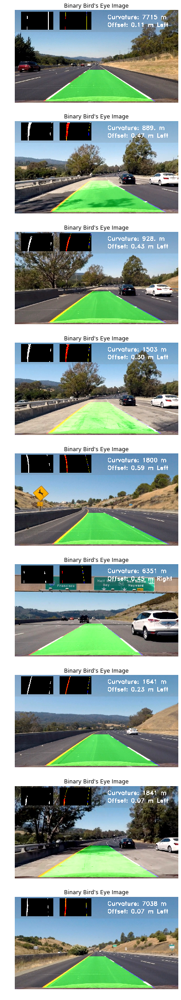

In [16]:
test_image_ls = glob.glob('./Finding_Lane_Lines_Advanced')
fig, axs = plt.subplots(len(test_images_ls), figsize = (25, 40))

idx = 0

for image in test_images_ls:
  
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  birdseye_img = warp_img(bin_img)
  left_x, left_y, right_x, right_y, winds_img = window_sample(birdseye_img, draw = False)
  curv = curvature(birdseye_img, left_x, left_y, right_x, right_y)
  left_curve, right_curve, winds_img = pol_lines_fit(winds_img, left_x, left_y, right_x, right_y, fill = False)

  _, _, left_pol_par, right_pol_par, ploty = pol_lines(out_img, left_x, left_y, right_x, right_y)
  veh_offset = offset(birdseye_img, left_pol_par, right_pol_par)
  M, Minv = transformation_mtx()
  tube_img = line_projection(udst_img, birdseye_img, left_curve, right_curve, ploty, Minv)
  
  blend_img = info_frame(tube_img, birdseye_img, winds_img, curv, veh_offset)  

  axs[idx].imshow(blend_img)
  axs[idx].axis('off')
  axs[idx].set_title("Binary Bird's Eye Image")
  
  idx += 1

## Video processing
In this section an additional function was implemented to process each frame of the video.

### lane_window:
>Similar to the **window_sample** function, **lane_window** takes the 2nd degree polynomial found in the first frame to create a search area, this in order to find the nonzero pixels. Once again when the nonzero pixels belonging to each side line are found the function calculates a new polynomial that will be used in the next frame.

>This function is created to enhance the speed processing of the algorithm; however, when the function does not detect any pixel, we should call again the **window_sample** function and start again the pixel searching.

### video_proc:
>This function calls all the functions explained in this approach, to process each frame of the video. Some global variables are defined and used within this function.

In [0]:
def lane_window(proc_img, left_curv, right_curv):
  ## Function to process new frames, by using the last lane curves.

    # Input: Bird's eye image, Left curve, Right curve
    # Output: X left indices, Y left indices, X right indices, Y right indices, Window image
    
  ##
  
  nzero = proc_img.nonzero()
  nzero_x = np.array(nzero[1])
  nzero_y = np.array(nzero[0])
  
  min_pix = 50
  t_width = 100
  
  out_img = np.dstack((proc_img, proc_img, proc_img)) * 255
  
  left_lef_bound = ((left_curv[0] * (nzero_y ** 2)) + (left_curv[1] * nzero_y) + left_curv[2] - t_width)
  left_rig_bound = ((left_curv[0] * (nzero_y ** 2)) + (left_curv[1] * nzero_y) + left_curv[2] + t_width)
  
  right_lef_bound = ((right_curv[0] * (nzero_y ** 2)) + (right_curv[1] * nzero_y) + right_curv[2] - t_width)
  right_rig_bound = ((right_curv[0] * (nzero_y ** 2)) + (right_curv[1] * nzero_y) + right_curv[2] + t_width)
  
  left_idx =  (nzero_x > left_lef_bound) & (nzero_x < left_rig_bound)
  right_idx =  (nzero_x > right_lef_bound) & (nzero_x < right_rig_bound)
  
  left_x = nzero_x[left_idx]
  left_y = nzero_y[left_idx]
  right_x = nzero_x[right_idx]
  right_y = nzero_y[right_idx]
  
  return left_x, left_y, right_x, right_y, out_img

In [0]:
# Definition of the global variables

global_vars = {'left_x': None,
               'left_y': None,
               'right_x': None,
               'right_y': None,
               'left_pol_par': None,
               'right_pol_par': None,
               'current_frame': None,
               'left_curve': None,
               'right_curve': None,
               'ploty': None}

In [0]:
def video_proc(img):
  ## Function to process eachs frame of video
  
    # Input: RGB image
    # Output: Pipeline image
  
  ##
  
  frm = global_vars['current_frame'] 
  
  udst_img = undistort_img(img, mtx, dist)
  bin_img = img_segmentation(udst_img)
  birdseye_img = warp_img(bin_img)
  M, Minv = transformation_mtx()
  
  if frm == 0:
    left_x, left_y, right_x, right_y, winds_img = window_sample(birdseye_img, draw = False)
  else:
    left_x, left_y, right_x, right_y, winds_img = lane_window(birdseye_img, global_vars['left_pol_par'], global_vars['right_pol_par'])
  
  left_curve, right_curve, winds_img = pol_lines_fit(winds_img, left_x, left_y, right_x, right_y, fill = False)
  _, _, left_pol_par, right_pol_par, ploty = pol_lines(out_img, left_x, left_y, right_x, right_y)
  
  curv = curvature(birdseye_img, left_x, left_y, right_x, right_y)
  veh_offset = offset(birdseye_img, left_pol_par, right_pol_par)
  tube_img = line_projection(udst_img, birdseye_img, left_curve, right_curve, ploty, Minv)
  
  blend_img = info_frame(tube_img, birdseye_img, winds_img, curv, veh_offset) 
  
  
  global_vars['left_x'] = left_x
  global_vars['left_y'] = left_y
  global_vars['right_x'] = right_x
  global_vars['right_y'] = right_y
  global_vars['left_curve'] =  left_curve
  global_vars['right_curve'] = right_curve
  global_vars['left_pol_par'] = left_pol_par
  global_vars['right_pol_par'] = right_pol_par
  global_vars['current_frame'] += 1
  
  return blend_img

In [20]:
from moviepy.editor import VideoFileClip

global_vars['current_frame'] = 0
global_vars['state'] = 0
Project_video = './Finding_Lane_Lines_Advanced/test_videos/project_video_output.mp4'
video_clip = VideoFileClip('./Finding_Lane_Lines_Advanced/test_videos/project_video.mp4')
output_clip = video_clip.fl_image(video_proc)
output_clip.write_videofile(Project_video, audio = False, progress_bar = False)

[MoviePy] >>>> Building video ./Finding_Lane_Lines_Advanced/test_videos/project_video_output.mp4
[MoviePy] Writing video ./Finding_Lane_Lines_Advanced/test_videos/project_video_output.mp4
[MoviePy] Done.
[MoviePy] >>>> Video ready: ./Finding_Lane_Lines_Advanced/test_videos/project_video_output.mp4 



In [21]:
global_vars['current_frame'] = 0
global_vars['state'] = 0

Project_video = './Finding_Lane_Lines_Advanced/test_videos/project_video_output.mp4'
video_clip = VideoFileClip('./Finding_Lane_Lines_Advanced/test_videos/project_video.mp4')
output_clip = video_clip.fl_image(video_proc)
gif_clip = output_clip.subclip(0, 5)
gif_clip.write_gif('Video_GIF.gif', fps = 10)


[MoviePy] Building file Video_GIF.gif with imageio


 98%|█████████▊| 50/51 [00:18<00:00,  2.90it/s]
